In [242]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import folium
import osmnx as ox
import skmob

from skmob.tessellation.tilers import tiler
from shapely.geometry import Point, LineString, Polygon, MultiPolygon
from geovoronoi import voronoi_regions_from_coords
from skmob.utils.plot import plot_gdf
from geovoronoi.plotting import subplot_for_map, plot_voronoi_polys_with_points_in_area
from scipy.spatial import Voronoi,voronoi_plot_2d

In [255]:
def to_GeoDataFrame(region_polys, regioni_sorted, geo_df):
    name=[]
    for i in range(len(region_polys)):
        name.append(geo_df.iloc[i].tile_ID)
    gdf = gpd.GeoDataFrame(columns=['tile_ID','geometry'], crs={'init': 'epsg:4326'})
    gdf['tile_ID'] = name
    for index, row in gdf.iterrows():
        gdf.at[index, 'geometry'] = region_polys[index]
    return gdf


def get_voronoi_tessellation(poly_ch, points, geo_df):
    #vor = Voronoi(points, qhull_options='Qbb Qc Qx')
    
    #fig = voronoi_plot_2d(vor)
    #plt.show()
    
    region_polys, region_pts = voronoi_regions_from_coords(points, poly_ch)
    
    # Mapping of region to be used to give names to Tessellation GeoDF
    regioni_sorted = {k: v for k, v in sorted(region_pts.items(), key=lambda item: item[0])}
    tess_voronoi = to_GeoDataFrame(region_polys, regioni_sorted, geo_df)
    return tess_voronoi

## GPS Dataset

In [256]:
# Loading gps DF
# https://figshare.com/ndownloader/files/14005292
gps= pd.read_csv("C:/Users/daddu/Downloads/GPS.csv")

# Deleting Locations with ambigous coords
gps = gps.drop_duplicates(subset=['Latitude','Longitude'], keep='first').rename(columns={'Location': 'tile_ID'})

gps.head()

,tile_ID,Latitude,Longitude
0,220102001000,43.853882,125.344108
1,220102002000,43.884234,125.331473
2,220102003000,43.881957,125.343187
3,220102004000,43.893253,125.342543
4,220102005000,43.899503,125.342342


In [257]:
#Generating list of coordinates of each Location
location_coords = list(zip(list(gps.Longitude), list(gps.Latitude)))
location_coords_np = np.array(location_coords)

#adding POINTs objs to gps (Geo)DataFrame
gps["geometry"] = [Point(el[0],el[1]) for el in location_coords]

gps.head()

C:\Users\daddu\anaconda3\envs\skmob\lib\site-packages\pandas\core\dtypes\cast.py:128: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


,tile_ID,Latitude,Longitude,geometry
0,220102001000,43.853882,125.344108,POINT (125.344108 43.853882)
1,220102002000,43.884234,125.331473,POINT (125.331473 43.884234)
2,220102003000,43.881957,125.343187,POINT (125.343187 43.881957)
3,220102004000,43.893253,125.342543,POINT (125.342543 43.893253)
4,220102005000,43.899503,125.342342,POINT (125.342342 43.899503)


## Mobility Dataset

In [271]:
# Loading Mobility DF
# https://figshare.com/ndownloader/files/14884442
mobility = pd.read_csv("C:/Users/daddu/Downloads/Mobility.csv")

In [282]:
#Renaming mobility columns
mobility.rename(columns={"Origin":"origin","Destination":"destination","Weight":"flow"}, inplace=True)

#Dropping rows with no flow amount
mobility = mobility[mobility['flow'] > 1]

#len(set(list(mobility.destination.values)))
mobility.head()

,origin,destination,flow,Time
0,220102001000,220102001000,117,2017-08-07T01+08
6,220102001000,220102007000,6,2017-08-07T01+08
7,220102001000,220102008000,5,2017-08-07T01+08
9,220102001000,220102010000,23,2017-08-07T01+08
10,220102001000,220102011000,3,2017-08-07T01+08


In [273]:
# List of valid locations
validi = set(list(gps.tile_ID.values))

#List of indexes to drop in Mobility df due to unvalid places
to_drop=[el[0] for i, el in enumerate(mobility.itertuples()) if el[1] not in validi or el[2] not in validi]
len(to_drop)

34505

In [274]:
#deleting those indexes
mobility = mobility.drop(index=to_drop, axis=0)

In [275]:
mobility.head()

,origin,destination,flow,Time
0,220102001000,220102001000,117,2017-08-07T01+08
6,220102001000,220102007000,6,2017-08-07T01+08
7,220102001000,220102008000,5,2017-08-07T01+08
9,220102001000,220102010000,23,2017-08-07T01+08
10,220102001000,220102011000,3,2017-08-07T01+08


## Visualizing the Geographic Area
##### _.. Southeast Songliao Basin, Northeast China Plain, including 4 different areas: Changchun City, Dehui City, Yushu City, and Nong’an County .._

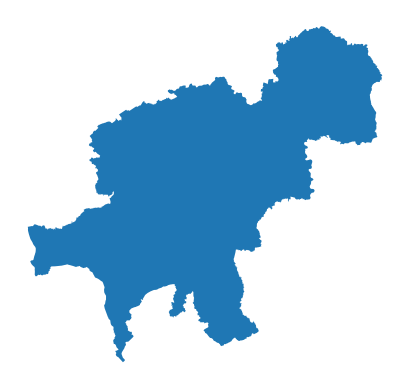

In [276]:
cina = ox.geocode_to_gdf("Changchun City, China")

ax = cina.plot()
_ = ax.axis('off')

In [277]:
#Voronoi's shapes and Point's mapping of the above geometry
region_polys, region_pts = voronoi_regions_from_coords(location_coords_np, cina.iloc[0].geometry)

#List of Voronoi shapes centroids
pts_voronoi_np = np.array([(val.centroid.x, val.centroid.y) for val in region_polys.values()])

In [278]:
#Tessellation GeoDF of "cina"
tess_voronoi_area = get_voronoi_tessellation(cina.iloc[0].geometry, pts_voronoi_np, gps)
tess_voronoi_area.head()

C:\Users\daddu\anaconda3\envs\skmob\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,tile_ID,geometry
0,220102001000,"POLYGON ((126.89396 45.13882, 126.89688 45.138..."
1,220102002000,"POLYGON ((124.49008 44.03442, 124.38499 43.762..."
2,220102003000,"POLYGON ((125.55361 44.79719, 125.42444 44.720..."
3,220102004000,"POLYGON ((126.33427 45.19136, 126.33458 45.191..."
4,220102005000,"POLYGON ((124.60104 44.33573, 124.60095 44.337..."


## Plots

In [279]:
#Folium plot
voronoi_folium = plot_gdf(tess_voronoi_area, zoom=7)
voronoi_folium

C:\Users\daddu\anaconda3\envs\skmob\lib\site-packages\skmob\utils\plot.py:635: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  vertices = [list(zip(*p.exterior.xy)) for p in gway]


In [280]:
#Flow DataFrame (subset of it) for visualization purposes
flow_df_sub = skmob.FlowDataFrame(mobility[:10000], 
                              flow=2,origin=0,destination=1,
                              tessellation=tess_voronoi_area, 
                              tile_id='tile_ID')

In [281]:
#Plotting tessellation + flow
m = flow_df_sub.plot_flows(map_f= voronoi_folium,
                       zoom = 12, opacity=0.8, 
                       flow_weight= 0.1,flow_color='red', tile_popup=True)
m

# Links

In [294]:
mobility.to_csv(r'mobility_Changchun_area.csv', header=None, index=None, sep=' ', mode='a', encoding="ISO-8859-1")

# .JSON link
# https://transfer.sh/%28/SEax0L/mobility_Changchun_area.json%29.zip

# Link JSON + .PY file .rar
# https://transfer.sh/%28/IKlsCV/mobility_Changchun_area.rar%29.zip